In [1]:
import librosa
from librosa import display
from PIL import Image
from matplotlib import pyplot
from numpy import asarray
import matplotlib.pyplot as plt
import numpy as np
import cmath
import seaborn as sns
import scipy
import IPython.display as ipd
import math
from numpy.linalg import inv
import torch 
import torchvision
from torchvision import datasets
import numpy as np
import time
import numpy
import matplotlib.pyplot as plt
import torch.nn as nn
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Uploading Audio Clean_Male

In [2]:
train_clean_male, sr1 = librosa.load("train_clean_male.wav",sr=None)
S=librosa.stft(train_clean_male,n_fft=1024,hop_length=512)
ipd.display(ipd.Audio(train_clean_male,rate=16000))

### Uploading Audio Dirty_Male

In [3]:
sn,sr2=librosa.load("train_dirty_male.wav",sr=None)
X=librosa.stft(sn,n_fft=1024,hop_length=512)
ipd.display(ipd.Audio(sn,rate=16000))

## Taking Magnitude of Clean_Male_Voice and Dirty_Male_Voice

In [4]:
mod_S=np.abs(S)
mod_X=np.abs(X)

## Appending 19 silent frames at the beggining of Dirty_Male_ Voice Spectogram

In [5]:
appended_input_X=np.zeros((513, 19))
concatenated_mod_X=np.concatenate((appended_input_X,mod_X),1)
np.shape(mod_S),np.shape(concatenated_mod_X)

((513, 2459), (513, 2478))

## Model Creation

 The Model Architecture is as follows:

 1) Convolution Layer with kernel size = 2, stride =1 and 8 filters followed ny ReLu Activation.

 2) Average Pooling with kernel size=2 and stride =1

 3)Convolution Layer with kernel size = 2, stride =1 and 16 filters followed ny ReLu Activation.

 4) Average Pooling with kernel size=2 and stride =1

 5) Convolution Layer with kernel size = 2, stride =2 and 32 filters followed ny ReLu Activation.

 6) Average Pooling with kernel size=2 and stride =2

 7) Reducing the layer to fullyconnected layer with 16256 neurons

 8) Two Fully connected layer with 8000 and 1000 neurons with Relu Activations.

 9) The final_output layer has 513 neurons as expected in the Output

 

In [6]:
class twodcnn(nn.Module):
    def __init__(self):
        super(twodcnn, self).__init__()

        self.conv = nn.Sequential(
                nn.Conv2d(1, 8, kernel_size=2, stride=1),
                nn.ReLU(),       
                nn.AvgPool2d(kernel_size=2, stride=1),
            
                nn.Conv2d(8, 16, kernel_size=2, stride=1),
                nn.ReLU(),
                nn.AvgPool2d(kernel_size=2, stride=1),
        
                nn.Conv2d(16, 32, kernel_size=2, stride=2),
                nn.ReLU(),
                nn.AvgPool2d(kernel_size=2, stride=2))

        self.fc1 = nn.Linear(in_features=16256, out_features=8000)
        self.fc2 = nn.Linear(in_features=8000, out_features=1000)
        self.fc3 = nn.Linear(in_features=1000, out_features=513)
        self.dropout = nn.Dropout(0.3)
        self.activation = nn.ReLU()
    def forward(self, data):
        conv_output = self.conv(data)
        output_flat = conv_output.reshape(conv_output.shape[0], -1)
        fc1_output = self.activation(self.fc1(output_flat))
        fc2_output = self.activation(self.fc2(fc1_output))
        final_output = self.activation(self.fc3(fc2_output))
        return final_output

## Intializing the Training Model

In [7]:
model1 = twodcnn().cuda()
# Loss and optimizer
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model1.parameters(),lr=0.0015)

## Creating Frames

In [8]:
def creating_frames(mod_X):
  new_data=[]
  k=len(mod_X[0])-19
  for j in range(k):
    images1= mod_X[:,j:(j+20)]
    new_data.append(np.transpose(images1))

  new_data1=torch.FloatTensor(new_data)
  new_data2=new_data1.reshape(k,1,20,513)

  return new_data2

## Function For SNR

In [9]:
def snr(ground_clean, recovered_one):
  import math
  a=min(len(ground_clean),len(recovered_one))

  ground1=ground_clean[0:a]
  recovered1=recovered_one[0:a]
  num=np.sum(np.square(ground1))
  diff=np.sum(np.square(ground1-recovered1))
  SNR=10*math.log(num/diff,10)
  return SNR

## Creating Input Data

In [10]:
new_data2=creating_frames(concatenated_mod_X)

In [11]:
print(np.shape(new_data2))

torch.Size([2459, 1, 20, 513])


In [12]:
errt=[0 for i in range(200)]
for epoch in range(200):
    running_loss=0
    for j in range(20):

        if (j+1)*128 <= 2459:
          images= new_data2[128*j:128*(j+1),:,:,:].cuda()
          labels=torch.tensor(mod_S[:,128*j:128*(j+1)],device=device)
        else:
          images= new_data2[128*j:2459,:,:,:].cuda()
          labels = torch.tensor(mod_S[:,j*128:2459],device=device)
      
        # Move tensors to the configured device

        # print(np.shape(images),"images",j)
        # print(np.shape(labels),"labels",j)
        
        # Forward pass
        outputs = model1(images.cuda()).cuda()
        loss = criterion(outputs.cuda(), torch.transpose(labels,0,1))
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss+=loss.item()
    errt[epoch]=running_loss/20
    print("Epoch:", epoch,"Loss:",running_loss/20)

Epoch: 0 Loss: 0.26442752350121734
Epoch: 1 Loss: 0.0882756377570331
Epoch: 2 Loss: 0.08685475084930658
Epoch: 3 Loss: 0.08626806028187275
Epoch: 4 Loss: 0.08348528374917805
Epoch: 5 Loss: 0.07831282261759043
Epoch: 6 Loss: 0.07289079590700567
Epoch: 7 Loss: 0.07234358992427588
Epoch: 8 Loss: 0.06811073422431946
Epoch: 9 Loss: 0.06491691065020859
Epoch: 10 Loss: 0.06304459874518216
Epoch: 11 Loss: 0.06409234707243741
Epoch: 12 Loss: 0.0615347885992378
Epoch: 13 Loss: 0.05735531547106802
Epoch: 14 Loss: 0.05594591391272843
Epoch: 15 Loss: 0.06161702135577798
Epoch: 16 Loss: 0.06194683262147009
Epoch: 17 Loss: 0.053910128632560374
Epoch: 18 Loss: 0.04986663600429893
Epoch: 19 Loss: 0.047678174334578216
Epoch: 20 Loss: 0.045366938295774165
Epoch: 21 Loss: 0.04292101864703
Epoch: 22 Loss: 0.0414094977080822
Epoch: 23 Loss: 0.04066494253929705
Epoch: 24 Loss: 0.03898681662976742
Epoch: 25 Loss: 0.037085762503556906
Epoch: 26 Loss: 0.03450380498543382
Epoch: 27 Loss: 0.03319090283475816
Epoc

Text(0.5, 1.0, 'Convergence Plot of Error')

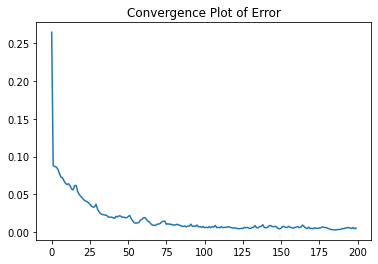

In [13]:
plt.figure()
plt.plot(errt)
plt.title('Convergence Plot of Error')

## Predicting the Signal for the Training Data

In [14]:
with torch.no_grad():
  new_outputs=model1(new_data2.cuda())

In [15]:
print(np.shape(new_outputs))

torch.Size([2459, 513])


In [16]:
train_signal=torch.transpose(new_outputs,0,1)
print(train_signal)

tensor([[0.0128, 0.0128, 0.0161,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0034],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')


## Recovered Signal for Training Signal

In [17]:
new_output_train=torch.div(torch.mul(torch.tensor(X,device=device),train_signal),torch.abs(torch.tensor(X,device=device)))
recovered_train=(new_output_train.data).cpu().numpy()
signal_train=librosa.core.istft(recovered_train, hop_length=512)
ipd.display(ipd.Audio(librosa.core.istft(recovered_train, hop_length=512),rate=16000))

## SNR Calculation for Training Data

In [18]:
snr(train_clean_male,signal_train)

12.782286760875671

In [19]:
librosa.output.write_wav( "train_signal.wav",signal_train, sr=16000, norm=False)

#### Uploading Test_x_01 signal


In [20]:
test_x_01,sr2=librosa.load("test_x_01.wav",sr=None)
ipd.display(ipd.Audio(test_x_01,rate=16000))

In [21]:
testx01=librosa.stft(test_x_01,n_fft=1024,hop_length=512)
testx01_abs=np.abs(testx01)
testx01_silent_frames=np.concatenate((np.zeros((513,19)),testx01_abs),1)
print(np.shape(testx01_abs))
print(np.shape(testx01_silent_frames))

(513, 142)
(513, 161)


In [22]:
input_data_test_x_01=creating_frames(testx01_silent_frames)

In [23]:
print(np.shape(input_data_test_x_01))

torch.Size([142, 1, 20, 513])


In [24]:
with torch.no_grad(): 
  new_outputs_test_x_01=model1(input_data_test_x_01.cuda()).cuda()
print(np.shape(new_outputs_test_x_01))

torch.Size([142, 513])


## Recovered Signal for Test Signal 1

In [25]:
new_outputs1_test_x_01=torch.transpose(new_outputs_test_x_01,0,1)
new_output2=torch.div(torch.mul(torch.tensor(testx01,device=device),new_outputs1_test_x_01),torch.abs(torch.tensor(testx01,device=device)))

recovered_test_01_x=(new_output2.data).cpu().numpy()
signal_test_01_x=librosa.core.istft(recovered_test_01_x, hop_length=512)
ipd.display(ipd.Audio(librosa.core.istft(recovered_test_01_x, hop_length=512),rate=16000))

## Uploading Test Signal test_x_02

In [26]:
test_x_02,sr2=librosa.load("test_x_02.wav",sr=None)
ipd.display(ipd.Audio(test_x_02,rate=16000))

In [27]:
testx02=librosa.stft(test_x_02,n_fft=1024,hop_length=512)
testx02_abs=np.abs(testx02)
testx02_silent_frames=np.concatenate((np.zeros((513,19)),testx02_abs),1)
print(np.shape(testx02_abs))
print(np.shape(testx02_silent_frames))

(513, 380)
(513, 399)


In [28]:
input_data_test_x_02=creating_frames(testx02_silent_frames)

In [29]:
print(np.shape(input_data_test_x_02))

torch.Size([380, 1, 20, 513])


In [30]:
with torch.no_grad(): 
  new_outputs_test_x_02=model1(input_data_test_x_02.cuda()).cuda()
print(np.shape(new_outputs_test_x_02))

torch.Size([380, 513])


## Recovered Signal for test_x_02

In [31]:
new_outputs1_test_x_02=torch.transpose(new_outputs_test_x_02,0,1)
new_output12=torch.div(torch.mul(torch.tensor(testx02,device=device),new_outputs1_test_x_02),torch.abs(torch.tensor(testx02,device=device)))

recovered_test_02_x=(new_output12.data).cpu().numpy()
signal_test_02_x=librosa.core.istft(recovered_test_02_x, hop_length=512)
ipd.display(ipd.Audio(librosa.core.istft(recovered_test_02_x, hop_length=512),rate=16000))